In [1]:
import numpy as np
from soursop import sstrajectory, ssprotein
import mdtraj as md
import pandas as pd
import os
import matplotlib.pyplot as plt
from matplotlib import colors
from mpl_toolkits.axes_grid1 import make_axes_locatable
from scipy.stats import sem

In [2]:
def read_psw(psw_file):
    psw = np.loadtxt(psw_file, skiprows=1, usecols=(1,2,3,4,5,6,7,8,9,10,11))
    return np.sum(psw, axis=1)

def get_fixed_idr_residues(psw_data, idr_idxs, idr_first):
    if idr_first:
        idr_psw = psw_data[idr_idxs[0]-1:idr_idxs[1]+1]
    else:
        idr_psw = psw_data[idr_idxs[0]-1:idr_idxs[1]]

    start = np.where(idr_psw<1.5)[0][0]
    try:
        end = np.where(idr_psw[start:]>1.5)[0][0] + start - 1
    except:
        end = len(idr_psw)-1

    return start, end

def load_trajectory(pdb, xtc, stride=1):
    # Load trajectory and protein objects
    print('Loading protein trajectory...')
    sstraj = sstrajectory.SSTrajectory(xtc, pdb, debug=False).traj[1::stride]
    ssprot = ssprotein.SSProtein(traj=sstraj, debug=False)
    
    return sstraj, ssprot
    
def get_interchain_dmap(prot, mode):
    stride=1
    periodic=False
    
    # use the previously identified residues with CA
    residuesWithCA = prot.resid_with_CA

    # initialize empty matrices that we're gonna fill up
    n_res = len(prot.resid_with_CA)
    
    top_df = prot.topology.to_dataframe()[0]
    chain_0_len = len(top_df.query("chainID == 0 and name == 'CA'"))
    chain_1_len = len(top_df.query("chainID == 1 and name == 'CA'"))

    # Initialize distance map
    distanceMap = np.zeros([len(prot), chain_0_len, chain_1_len])
    print('Creating distance map...')

    # cycle over CA-containing residues
    SM_index = 0
    for resIndex in prot.resid_with_CA[0:chain_0_len]:
        # get all distances between the residue of index resIndex and every other residue.
        # Note this gives the non-redudant upper triangle.
        full_data = prot.calculate_all_CA_distances(resIndex, mode=mode, stride=stride, periodic=periodic)
        inter_chain_contacts = full_data[:, -chain_1_len:]
        distanceMap[:, SM_index, :] = inter_chain_contacts
        SM_index=SM_index+1
        
    return distanceMap

def get_contact_freq_map(dmap, contact_distance_threshold):
    return (dmap <= contact_distance_threshold).mean(axis=0)

def relative_change_cmap_vs_EV(full_cmap, EV_cmap):
    log_cmap = np.log(full_cmap, where=(full_cmap>0), out=np.zeros_like(full_cmap))
    log_ev = np.log(EV_cmap, where=(EV_cmap>0), out=np.zeros_like(EV_cmap))
    return log_cmap - log_ev

def absolute_change_cmap_vs_EV(full_cmap, EV_cmap):
    return full_cmap - EV_cmap

# Plotting functions
def plot_contact_heatmap(cmap, fixed_idr_residues):
    plt.figure(figsize=(3,3), dpi=200)
    ax = plt.gca()
    im = ax.imshow(cmap, cmap='afmhot_r', 
                   norm=colors.PowerNorm(gamma=0.2, vmin=0, vmax=1),
                   interpolation='none')

    ax.hlines(fixed_idr_residues[0], 0, len(cmap[0]), color='black', linestyle='-', linewidth=0.1)
    ax.hlines(fixed_idr_residues[1], 0, len(cmap[0]), color='black', linestyle='-', linewidth=0.1)

    ax.set_title('Contact frequency', fontweight='bold')
    ax.set_xlabel('FD residues')
    ax.set_ylabel('IDR residues')
    ax.set_xlim(0,len(cmap[0]))

    # create an axes on the right side of ax. The width of cax will be 5%
    # of ax and the padding between cax and ax will be fixed at 0.05 inch.
    divider = make_axes_locatable(ax)
    cax = divider.append_axes("right", size="5%", pad=0.05)

    cbar = plt.colorbar(im, cax=cax)
    tick_font_size = 6
    cbar.ax.tick_params(labelsize=tick_font_size)
    
    plt.show()
    
def plot_ev_rel_comparison_heatmap(norm_cmap, fixed_idr_residues):
    plt.figure(figsize=(3,3), dpi=200)
    ax = plt.gca()
    im = ax.imshow(norm_cmap, cmap='seismic_r', interpolation='none', vmin=-8, vmax=8)

    ax.hlines(fixed_idr_residues[0], 0, len(norm_cmap[0]), color='black', linestyle='-', linewidth=0.1)
    ax.hlines(fixed_idr_residues[1], 0, len(norm_cmap[0]), color='black', linestyle='-', linewidth=0.1)

    ax.set_title(r'Relative $\Delta$ contact freq', fontweight='bold')
    ax.set_xlabel('FD residues')
    ax.set_ylabel('IDR residues')
    ax.set_xlim(0,len(norm_cmap[0]))

    # create an axes on the right side of ax. The width of cax will be 5%
    # of ax and the padding between cax and ax will be fixed at 0.05 inch.
    divider = make_axes_locatable(ax)
    cax = divider.append_axes("right", size="5%", pad=0.05)

    cbar = plt.colorbar(im, cax=cax)
    tick_font_size = 6
    cbar.ax.tick_params(labelsize=tick_font_size)

    plt.show()

    
    
def plot_ev_abs_comparison_heatmap(norm_cmap, fixed_idr_residues):
    plt.figure(figsize=(3,3), dpi=200)
    ax = plt.gca()

    im = ax.imshow(norm_cmap, cmap='seismic_r', interpolation='none', vmin=-0.16, vmax=0.16)

    ax.hlines(fixed_idr_residues[0], 0, len(norm_cmap[0]), color='black', linestyle='-', linewidth=0.1)
    ax.hlines(fixed_idr_residues[1], 0, len(norm_cmap[0]), color='black', linestyle='-', linewidth=0.1)

    ax.set_title(r'Absolute $\Delta$ contact freq', fontweight='bold')
    ax.set_xlabel('FD residues')
    ax.set_ylabel('IDR residues')
    ax.set_xlim(0,len(norm_cmap[0]))

    # create an axes on the right side of ax. The width of cax will be 5%
    # of ax and the padding between cax and ax will be fixed at 0.05 inch.
    divider = make_axes_locatable(ax)
    cax = divider.append_axes("right", size="5%", pad=0.05)

    cbar = plt.colorbar(im, cax=cax, ticks=[-0.15, -0.1, -0.05, 0, 0.05, 0.1, 0.15])
    tick_font_size = 6
    cbar.ax.tick_params(labelsize=tick_font_size)
    
    plt.show()
    
    
def combined_plots(cmap, ev_cmap, full_frames, ev_frames, fixed_idr_residues, baseline='EV', title='IDR-FD', out=None):
    tick_font_size = 6
    
    fig, axs = plt.subplots(2,2, figsize=(8,8), dpi=300)
    
    # Top left - Full forces "raw" contact map
    im = axs[0,0].imshow(cmap, cmap='afmhot_r', 
                   norm=colors.PowerNorm(gamma=0.2, vmin=0, vmax=1),
                   interpolation='none')

    axs[0,0].hlines(fixed_idr_residues[0], 0, len(cmap[0]), color='black', linestyle='-', linewidth=0.1)
    axs[0,0].hlines(fixed_idr_residues[1], 0, len(cmap[0]), color='black', linestyle='-', linewidth=0.1)
    axs[0,0].set_title('IDR-FD contact freq', fontweight='bold', fontsize=8)
    axs[0,0].set_xlabel('FD residues')
    axs[0,0].set_ylabel('IDR residues')
    axs[0,0].set_xlim(0,len(cmap[0]))

    # create an axes on the right side of ax. The width of cax will be 5%
    # of ax and the padding between cax and ax will be fixed at 0.05 inch.
    divider = make_axes_locatable(axs[0,0])
    cax = divider.append_axes("right", size="5%", pad=0.05)
    cbar = plt.colorbar(im, cax=cax)
    cbar.ax.tick_params(labelsize=tick_font_size)
    
    # Top right - EV "raw" contact map
    im = axs[0,1].imshow(ev_cmap, cmap='afmhot_r', 
                   norm=colors.PowerNorm(gamma=0.2, vmin=0, vmax=1),
                   interpolation='none')

    axs[0,1].hlines(fixed_idr_residues[0], 0, len(ev_cmap[0]), color='black', linestyle='-', linewidth=0.1)
    axs[0,1].hlines(fixed_idr_residues[1], 0, len(ev_cmap[0]), color='black', linestyle='-', linewidth=0.1)
    axs[0,1].set_title(f'{baseline} contact freq', fontweight='bold', fontsize=8)
    axs[0,1].set_xlabel('FD residues')
    axs[0,1].set_ylabel('IDR residues')
    axs[0,1].set_xlim(0,len(ev_cmap[0]))

    # create an axes on the right side of ax. The width of cax will be 5%
    # of ax and the padding between cax and ax will be fixed at 0.05 inch.
    divider = make_axes_locatable(axs[0,1])
    cax = divider.append_axes("right", size="5%", pad=0.05)
    cbar = plt.colorbar(im, cax=cax)
    cbar.ax.tick_params(labelsize=tick_font_size)
    
    # Lower left - Relative change in contact freq between full and EV
    rel_norm_cmap = relative_change_cmap_vs_EV(cmap*full_frames, ev_cmap*ev_frames)
    im = axs[1,0].imshow(rel_norm_cmap, cmap='seismic_r', interpolation='none', vmin=-8, vmax=8)

    axs[1,0].hlines(fixed_idr_residues[0], 0, len(rel_norm_cmap[0]), color='black', linestyle='-', linewidth=0.1)
    axs[1,0].hlines(fixed_idr_residues[1], 0, len(rel_norm_cmap[0]), color='black', linestyle='-', linewidth=0.1)

    axs[1,0].set_title(r'Relative $\Delta$ contact freq', fontweight='bold', fontsize=8)
    axs[1,0].set_xlabel('FD residues')
    axs[1,0].set_ylabel('IDR residues')
    axs[1,0].set_xlim(0,len(rel_norm_cmap[0]))

    # create an axes on the right side of ax. The width of cax will be 5%
    # of ax and the padding between cax and ax will be fixed at 0.05 inch.
    divider = make_axes_locatable(axs[1,0])
    cax = divider.append_axes("right", size="5%", pad=0.05)
    cbar = plt.colorbar(im, cax=cax)
    cbar.ax.tick_params(labelsize=tick_font_size)
    
    abs_norm_cmap = absolute_change_cmap_vs_EV(cmap, ev_cmap)
    im = axs[1,1].imshow(abs_norm_cmap, cmap='seismic_r', interpolation='none', vmin=-0.16, vmax=0.16)

    axs[1,1].hlines(fixed_idr_residues[0], 0, len(abs_norm_cmap[0]), color='black', linestyle='-', linewidth=0.1)
    axs[1,1].hlines(fixed_idr_residues[1], 0, len(abs_norm_cmap[0]), color='black', linestyle='-', linewidth=0.1)

    axs[1,1].set_title(r'Absolute $\Delta$ contact freq', fontweight='bold', fontsize=8)
    axs[1,1].set_xlabel('FD residues')
    axs[1,1].set_ylabel('IDR residues')
    axs[1,1].set_xlim(0,len(abs_norm_cmap[0]))

    # create an axes on the right side of ax. The width of cax will be 5%
    # of ax and the padding between cax and ax will be fixed at 0.05 inch.
    divider = make_axes_locatable(axs[1,1])
    cax = divider.append_axes("right", size="5%", pad=0.05)
    cbar = plt.colorbar(im, cax=cax, ticks=[-0.15, -0.1, -0.05, 0, 0.05, 0.1, 0.15])
    cbar.ax.tick_params(labelsize=tick_font_size)
    
    plt.suptitle(title, fontweight='bold', fontsize=14)
    plt.tight_layout()

    if out is not None:
        plt.savefig(out)

    plt.show()
    
# Functions to assess sampling quality
def extract_windows(array, window_size):
    sub_windows = (
        # expand_dims are used to convert a 1D array to 2D array.
        np.expand_dims(np.arange(window_size), 0) +
        np.expand_dims(np.arange(len(array)-window_size+1), 0).T
    ) 
    return array[sub_windows]


def dihedral_variation(angles, res_window=5, frame_window=41, plot=False):
    # res_window and frame_window must be odd!
    if res_window % 2 != 1 or frame_window % 2 != 1:
        raise Exception('res_window and frame_window must be odd integers')
    else:
        frame_window_edge = (frame_window - 1) / 2

    diffs = angles[1:] - angles[:-1]
    # print(diffs.shape)

    local_diffs = extract_windows(diffs.T, window_size=res_window)
    # print(local_diffs.shape)

    local_sum_squared = np.sum(local_diffs**2, axis=1).T
    # print(local_sum_squared.shape)

    per_frame_local_variation = np.sum(local_sum_squared, axis=1)
    # print(per_frame_local_variation.shape)

    # Sliding window average of per-frame local variation
    frame_variation_windows = extract_windows(per_frame_local_variation, frame_window)
    avg_frame_variation = np.mean(frame_variation_windows, axis=1)

    avg_frame_variation = np.concatenate([[avg_frame_variation[0]]*int(frame_window_edge), 
                                           avg_frame_variation, 
                                          [avg_frame_variation[-1]]*int(frame_window_edge)])

    if plot:
        fig, ax = plt.subplots(1, 1, figsize=(8,4), dpi=200)

        ax.plot(np.arange(len(per_frame_local_variation)), 
                    per_frame_local_variation, 
                    linewidth=0.1, color='blue', alpha=0.7)
        ax.hlines(np.mean(per_frame_local_variation), 0, len(per_frame_local_variation)-1, color='k', linestyle='--')
        ax.plot(np.arange(len(avg_frame_variation)),
                    avg_frame_variation, color='blue', linewidth=0.8, linestyle=':')
        ax.set_ylabel('Avg frame variation')

        ax.set_xlim([0, len(per_frame_local_variation)-1])
        plt.tight_layout()
        plt.show()

    return avg_frame_variation

def assess_sampling(pdb, xtc, stride=1, chain=0, plot=True):
    TrajObj = sstrajectory.SSTrajectory(xtc, pdb, debug=False)
    ProtObj = TrajObj.proteinTrajectoryList[chain]
    traj = ProtObj.traj[::stride]
    
    psi = md.compute_psi(traj)[1]
    phi = md.compute_phi(traj)[1]

    vals = dihedral_variation(psi, 5, 41, plot=plot)
    return np.mean(vals)



In [3]:
structures = ['structure_1', 'structure_2']

root = '/work/degriffith/TADs/fixed_TAD_sims/p300_coactivators/flanking_idr_sims/sims/round1_IDR_variants_TAZ2_WT/'

with open(root + 'structure_1/submission_list.txt') as f:
    variants = [x.strip() for x in f]
print(variants)

['RemoveNegCharge_41-50_ATF4_8_TAZ2_WT', 'RemoveNegCharge_61-70_ATF4_8_TAZ2_WT', 'RemoveNegCharge_71-80_ATF4_8_TAZ2_WT', 'RemoveAllNegCharge_ATF4_8_TAZ2_WT', 'RemovePosCharge_ATF4_8_TAZ2_WT', 'RemoveHydrophobic_41-50_ATF4_8_TAZ2_WT', 'RemoveHydrophobic_61-70_ATF4_8_TAZ2_WT', 'RemoveHydrophobic_71-80_ATF4_8_TAZ2_WT', 'SufficiencyNegCharge_ATF4_8_TAZ2_WT', 'SufficiencyHydrophobic_ATF4_8_TAZ2_WT', 'SufficiencyNegChargeHydrophobic_ATF4_8_TAZ2_WT', 'RemoveNegCharge_31-40_FOXO1_56_TAZ2_WT', 'RemoveNegCharge_71-80_FOXO1_56_TAZ2_WT', 'RemoveAllNegCharge_FOXO1_56_TAZ2_WT', 'RemovePosCharge_FOXO1_56_TAZ2_WT', 'RemoveHydrophobic_1-10_FOXO1_56_TAZ2_WT', 'RemoveHydrophobic_11-20_FOXO1_56_TAZ2_WT', 'RemoveHydrophobic_21-30_FOXO1_56_TAZ2_WT', 'RemoveHydrophobic_31-40_FOXO1_56_TAZ2_WT', 'RemoveHydrophobic_71-80_FOXO1_56_TAZ2_WT', 'SufficiencyNegCharge_FOXO1_56_TAZ2_WT', 'SufficiencyHydrophobic_FOXO1_56_TAZ2_WT', 'SufficiencyNegChargeHydrophobic_FOXO1_56_TAZ2_WT', 'RemoveNegCharge_1-10_TAF6L_37_TAZ2_WT

In [9]:
output_dir = '/home/degriffith/projects/TADs/bound_sims/flanking_contacts/p300_coactivators_analyses/figures/round1_variants'
mode='COM'
threshold=10

# ----------------- #

# WT
data = {}
EV_data = {}

for v in variants:
    for s in structures:
        # Fixed IDR residue idxs for full motif
        print(f'{v} {s}')
        psw_path = f"{root}/{s}/{v}/coil_start/1/PSWFILE.psw"
        psw_data = read_psw(psw_path)
        fixed_idr_residue_idxs = get_fixed_idr_residues(psw_data, [1,80], True)
    
    
        dmap_list = []
        cmap_list = []
        ev_dmap_list = []
        ev_cmap_list = []

        for repl in range(1, 5):
            i = repl-1
            try:
                print(repl)
                wt_pdb = f'{root}/{s}/{v}/coil_start/{repl}/EquilMC_END.pdb'
                wt_xtc = f'{root}/{s}/{v}/coil_start/{repl}/StandardMC_traj.xtc'

                traj, prot = load_trajectory(wt_pdb, wt_xtc, stride=1)
                dmap = get_interchain_dmap(prot, mode=mode)
                dmap_list.append(dmap)
                cmap_list.append(get_contact_freq_map(dmap, threshold))

                ev_pdb = f'{root}/{s}/ev/{v}/coil_start/1/EquilMC_END.pdb'
                ev_xtc = f'{root}/{s}/ev/{v}/coil_start/1/StandardMC_traj.xtc'

                ev_traj, ev_prot = load_trajectory(ev_pdb, ev_xtc, stride=1)
                ev_dmap = get_interchain_dmap(ev_prot, mode=mode)
                ev_dmap_list.append(ev_dmap)
                ev_cmap_list.append(get_contact_freq_map(ev_dmap, threshold))
            except:
                print(f'{v} {s} {repl}')
                continue

    print('Done!')

    # Combine dmaps and create contact map
    merged_dmap = np.vstack(dmap_list)
    full_nframes = len(merged_dmap)
    cmap = get_contact_freq_map(merged_dmap, threshold)

    ev_merged_dmap = np.vstack(ev_dmap_list)
    full_nframes = len(ev_merged_dmap)
    ev_cmap = get_contact_freq_map(ev_merged_dmap, threshold)

    # mean & std idr/fd contacts
    idrs = []
    fds = []
    for c in cmap_list:
        # Set contacts involving bound region to zero
        c[fixed_idr_residue_idxs[0]-1:fixed_idr_residue_idxs[1]] = 0
        idrs.append(c.sum(axis=1).flatten())
        fds.append(c.sum(axis=0).flatten())

    idr_mean = np.vstack(idrs).mean(axis=0)
    idr_sem = sem(np.vstack(idrs), axis=0)
    fd_mean = np.vstack(fds).mean(axis=0)
    fd_sem = sem(np.vstack(fds), axis=0)

    data[v] = {'nframes':full_nframes, 'cmap':cmap, 'fixed_res':fixed_idr_residue_idxs, 
                   'idr_contact_mean':idr_mean, 'idr_contact_stderr':idr_sem,
                   'fd_contact_mean':fd_mean, 'fd_contact_stderr':fd_sem}

    # mean & std idr/fd contacts
    ev_idrs = []
    ev_fds = []
    for c in ev_cmap_list:
        # Set contacts involving bound region to zero
        c[fixed_idr_residue_idxs[0]-1:fixed_idr_residue_idxs[1]] = 0
        ev_idrs.append(c.sum(axis=1).flatten())
        ev_fds.append(c.sum(axis=0).flatten())

    ev_idr_mean = np.vstack(ev_idrs).mean(axis=0)
    ev_idr_sem = sem(np.vstack(ev_idrs), axis=0)
    ev_fd_mean = np.vstack(ev_fds).mean(axis=0)
    ev_fd_sem = sem(np.vstack(ev_fds), axis=0)

    EV_data[v] = {'nframes':full_nframes, 'cmap':ev_cmap,
                     'idr_contact_mean':ev_idr_mean, 'idr_contact_stderr':ev_idr_sem,
                     'fd_contact_mean':ev_fd_mean, 'fd_contact_stderr':ev_fd_sem}
                
            



RemoveNegCharge_41-50_ATF4_8_TAZ2_WT structure_1
1
Loading protein trajectory...
Creating distance map...
Loading protein trajectory...
Creating distance map...
2
Loading protein trajectory...
Creating distance map...
Loading protein trajectory...
Creating distance map...
3
Loading protein trajectory...
Creating distance map...
Loading protein trajectory...
Creating distance map...
4
Loading protein trajectory...
Creating distance map...
Loading protein trajectory...
Creating distance map...
RemoveNegCharge_41-50_ATF4_8_TAZ2_WT structure_2
1
Loading protein trajectory...
Creating distance map...
Loading protein trajectory...
Creating distance map...
2
Loading protein trajectory...
Creating distance map...
Loading protein trajectory...
Creating distance map...
3
Loading protein trajectory...
Creating distance map...
Loading protein trajectory...
Creating distance map...
4
Loading protein trajectory...
Creating distance map...
Loading protein trajectory...
Creating distance map...
Done!


Loading protein trajectory...
Creating distance map...
3
Loading protein trajectory...
Creating distance map...
Loading protein trajectory...
Creating distance map...
4
Loading protein trajectory...
Creating distance map...
Loading protein trajectory...
Creating distance map...
SufficiencyNegCharge_ATF4_8_TAZ2_WT structure_2
1
Loading protein trajectory...
Creating distance map...
Loading protein trajectory...
Creating distance map...
2
Loading protein trajectory...
Creating distance map...
Loading protein trajectory...
Creating distance map...
3
Loading protein trajectory...
Creating distance map...
Loading protein trajectory...
Creating distance map...
4
Loading protein trajectory...
Creating distance map...
Loading protein trajectory...
Creating distance map...
Done!
SufficiencyHydrophobic_ATF4_8_TAZ2_WT structure_1
1
Loading protein trajectory...
Creating distance map...
Loading protein trajectory...
Creating distance map...
2
Loading protein trajectory...
Creating distance map...


4
Loading protein trajectory...
Creating distance map...
Loading protein trajectory...
Creating distance map...
RemoveHydrophobic_11-20_FOXO1_56_TAZ2_WT structure_2
1
Loading protein trajectory...
Creating distance map...
Loading protein trajectory...
Creating distance map...
2
Loading protein trajectory...
Creating distance map...
Loading protein trajectory...
Creating distance map...
3
Loading protein trajectory...
Creating distance map...
Loading protein trajectory...
Creating distance map...
4
Loading protein trajectory...
Creating distance map...
Loading protein trajectory...
Creating distance map...
Done!
RemoveHydrophobic_21-30_FOXO1_56_TAZ2_WT structure_1
1
Loading protein trajectory...
Creating distance map...
Loading protein trajectory...
Creating distance map...
2
Loading protein trajectory...
Creating distance map...
Loading protein trajectory...
Creating distance map...
3
Loading protein trajectory...
Creating distance map...
Loading protein trajectory...
Creating distance

1
Loading protein trajectory...
Creating distance map...
Loading protein trajectory...
Creating distance map...
2
Loading protein trajectory...
Creating distance map...
Loading protein trajectory...
Creating distance map...
3
Loading protein trajectory...
Creating distance map...
Loading protein trajectory...
Creating distance map...
4
Loading protein trajectory...
Creating distance map...
Loading protein trajectory...
Creating distance map...
Done!
RemoveNegCharge_31-40_TAF6L_37_TAZ2_WT structure_1
1
Loading protein trajectory...
Creating distance map...
Loading protein trajectory...
Creating distance map...
2
Loading protein trajectory...
Creating distance map...
Loading protein trajectory...
Creating distance map...
3
Loading protein trajectory...
Creating distance map...
Loading protein trajectory...
Creating distance map...
4
Loading protein trajectory...
Creating distance map...
Loading protein trajectory...
Creating distance map...
RemoveNegCharge_31-40_TAF6L_37_TAZ2_WT structur

Loading protein trajectory...
Creating distance map...
3
Loading protein trajectory...
Creating distance map...
Loading protein trajectory...
Creating distance map...
4
Loading protein trajectory...
Creating distance map...
Loading protein trajectory...
Creating distance map...
Done!
RemoveHydrophobic_41-50_TAF6L_37_TAZ2_WT structure_1
1
Loading protein trajectory...
Creating distance map...
Loading protein trajectory...
Creating distance map...
2
Loading protein trajectory...
Creating distance map...
Loading protein trajectory...
Creating distance map...
3
Loading protein trajectory...
Creating distance map...
Loading protein trajectory...
Creating distance map...
4
Loading protein trajectory...
Creating distance map...
Loading protein trajectory...
Creating distance map...
RemoveHydrophobic_41-50_TAF6L_37_TAZ2_WT structure_2
1
Loading protein trajectory...
Creating distance map...
Loading protein trajectory...
Creating distance map...
2
Loading protein trajectory...
Creating distance

Creating distance map...
Loading protein trajectory...
Creating distance map...
Done!
TAF6L_motif-FOXO1_IDR_TAZ2_WT structure_1
1
Loading protein trajectory...
Creating distance map...
Loading protein trajectory...
Creating distance map...
2
Loading protein trajectory...
Creating distance map...
Loading protein trajectory...
Creating distance map...
3
Loading protein trajectory...
Creating distance map...
Loading protein trajectory...
Creating distance map...
4
Loading protein trajectory...
Creating distance map...
Loading protein trajectory...
Creating distance map...
TAF6L_motif-FOXO1_IDR_TAZ2_WT structure_2
1
Loading protein trajectory...
Creating distance map...
Loading protein trajectory...
Creating distance map...
2
Loading protein trajectory...
Creating distance map...
Loading protein trajectory...
Creating distance map...
3
Loading protein trajectory...
Creating distance map...
Loading protein trajectory...
Creating distance map...
4
Loading protein trajectory...
Creating dista

In [10]:
EV_data

{'RemoveNegCharge_41-50_ATF4_8_TAZ2_WT': {'nframes': 39996,
  'cmap': array([[0.        , 0.        , 0.        , ..., 0.        , 0.        ,
          0.00050005],
         [0.        , 0.        , 0.        , ..., 0.        , 0.        ,
          0.00010001],
         [0.        , 0.        , 0.        , ..., 0.        , 0.        ,
          0.        ],
         ...,
         [0.00060006, 0.00020002, 0.00020002, ..., 0.00010001, 0.00020002,
          0.        ],
         [0.00070007, 0.00030003, 0.00040004, ..., 0.        , 0.        ,
          0.        ],
         [0.0010001 , 0.00030003, 0.00030003, ..., 0.        , 0.00020002,
          0.00010001]]),
  'idr_contact_mean': array([4.79047905e-02, 3.75037504e-02, 3.32033203e-02, 4.20042004e-02,
         7.28072807e-02, 1.07010701e-01, 3.88338834e-01, 1.14561456e+00,
         3.85718572e+00, 9.71317132e+00, 0.00000000e+00, 0.00000000e+00,
         0.00000000e+00, 0.00000000e+00, 0.00000000e+00, 0.00000000e+00,
         0.00000

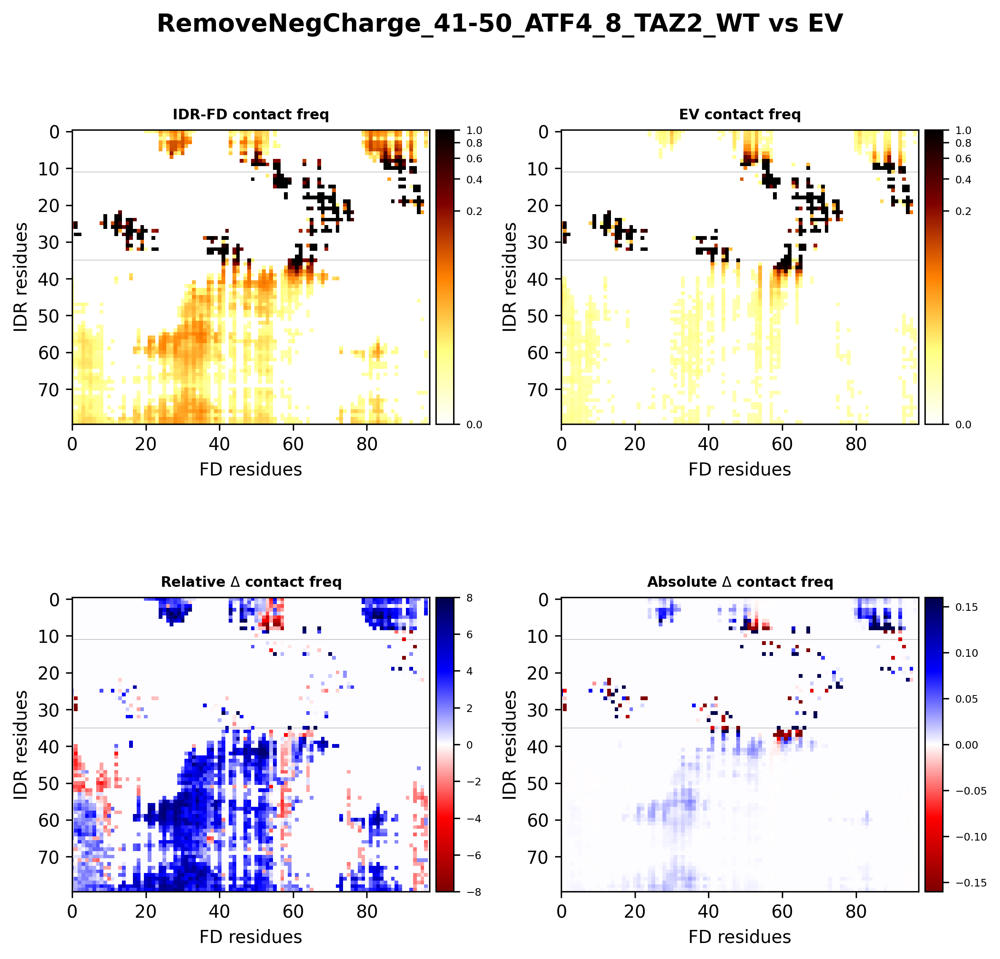

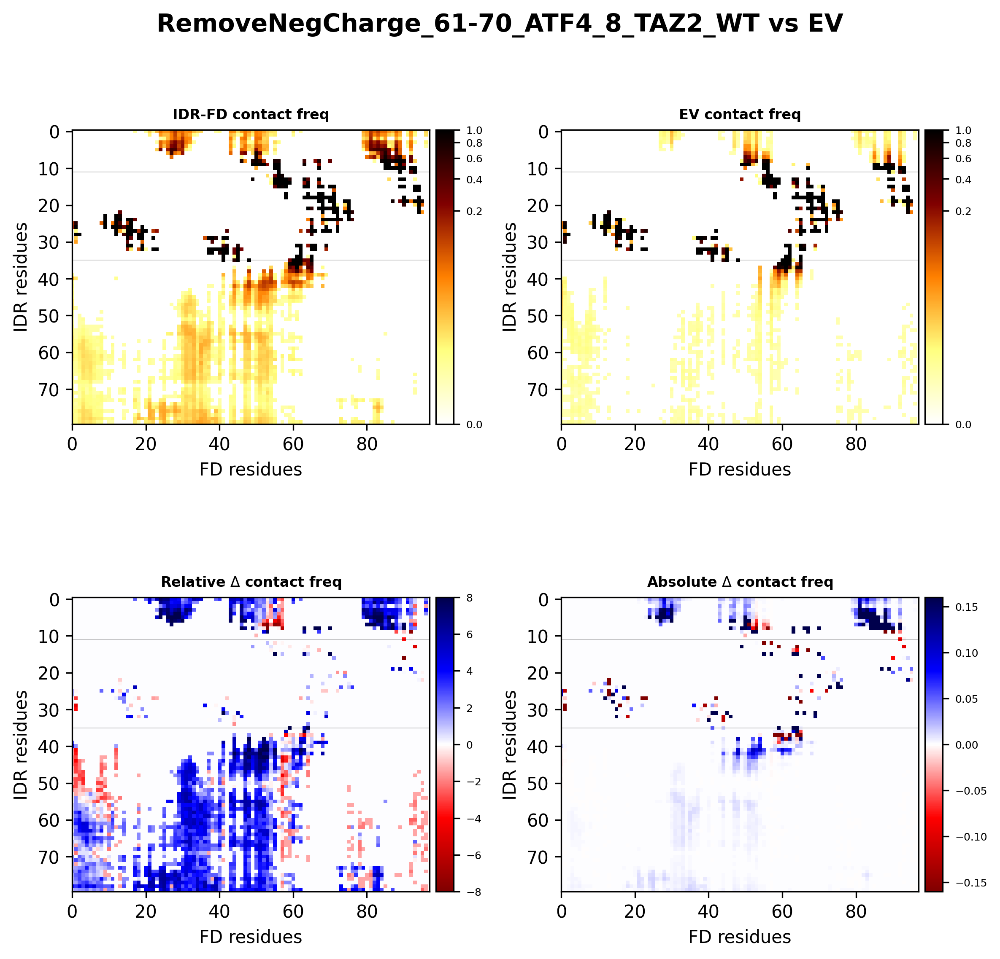

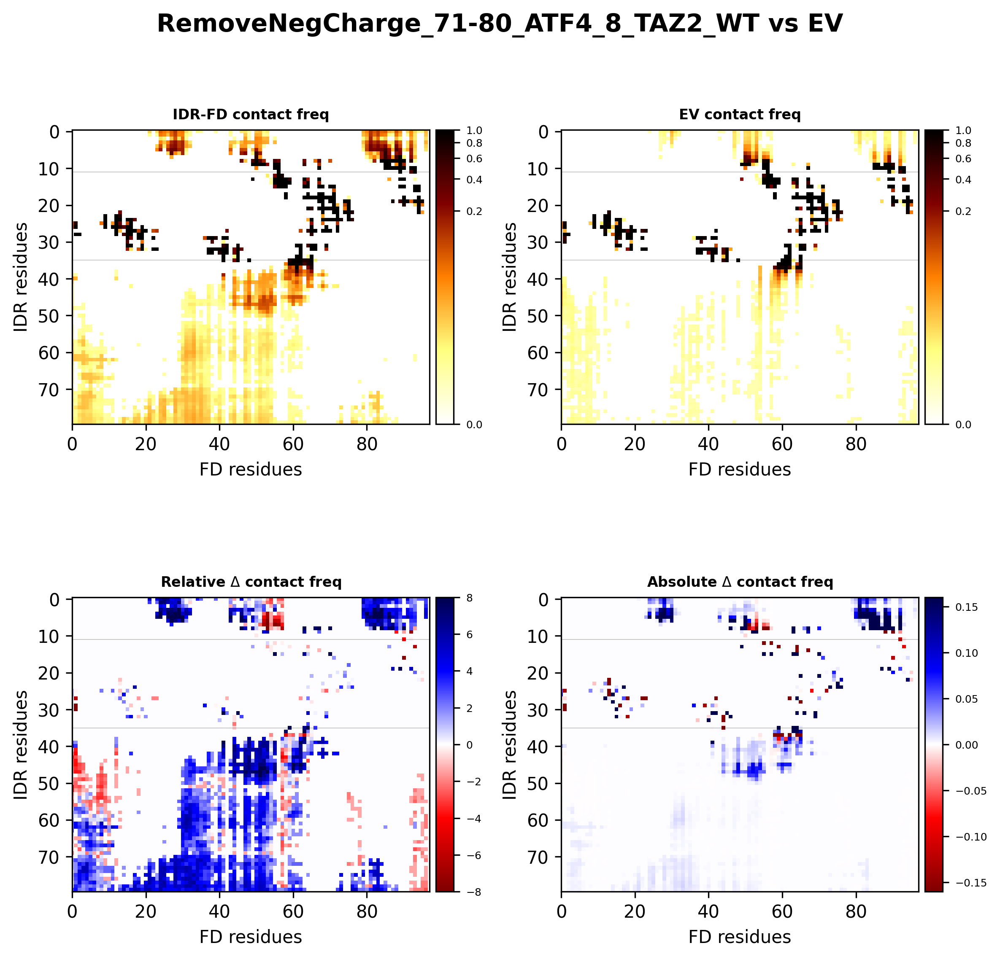

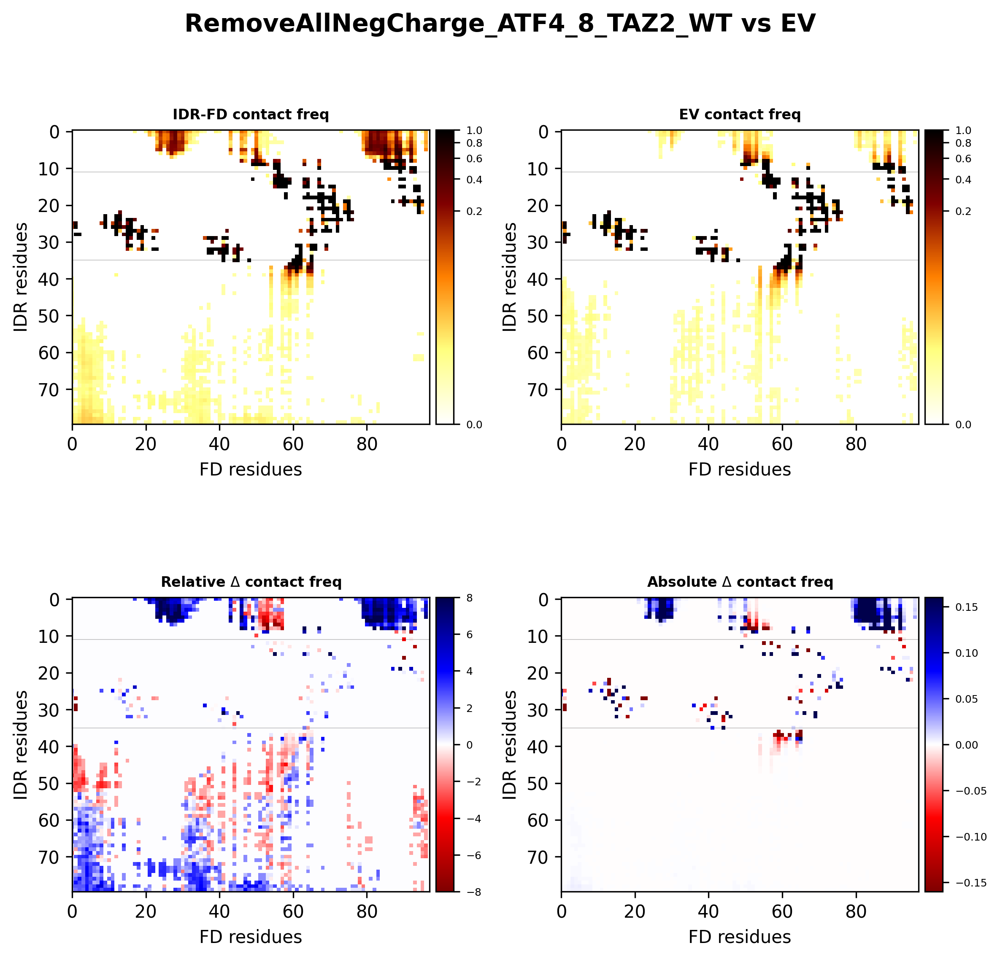

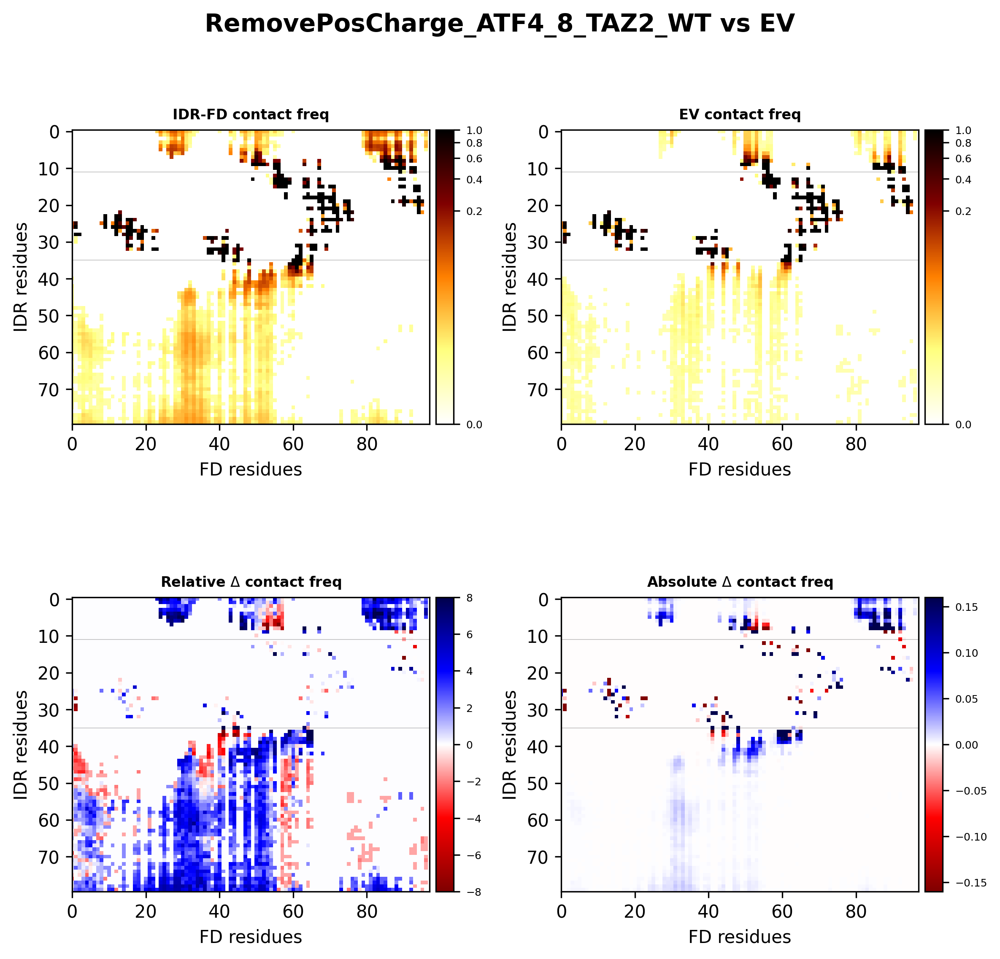

...

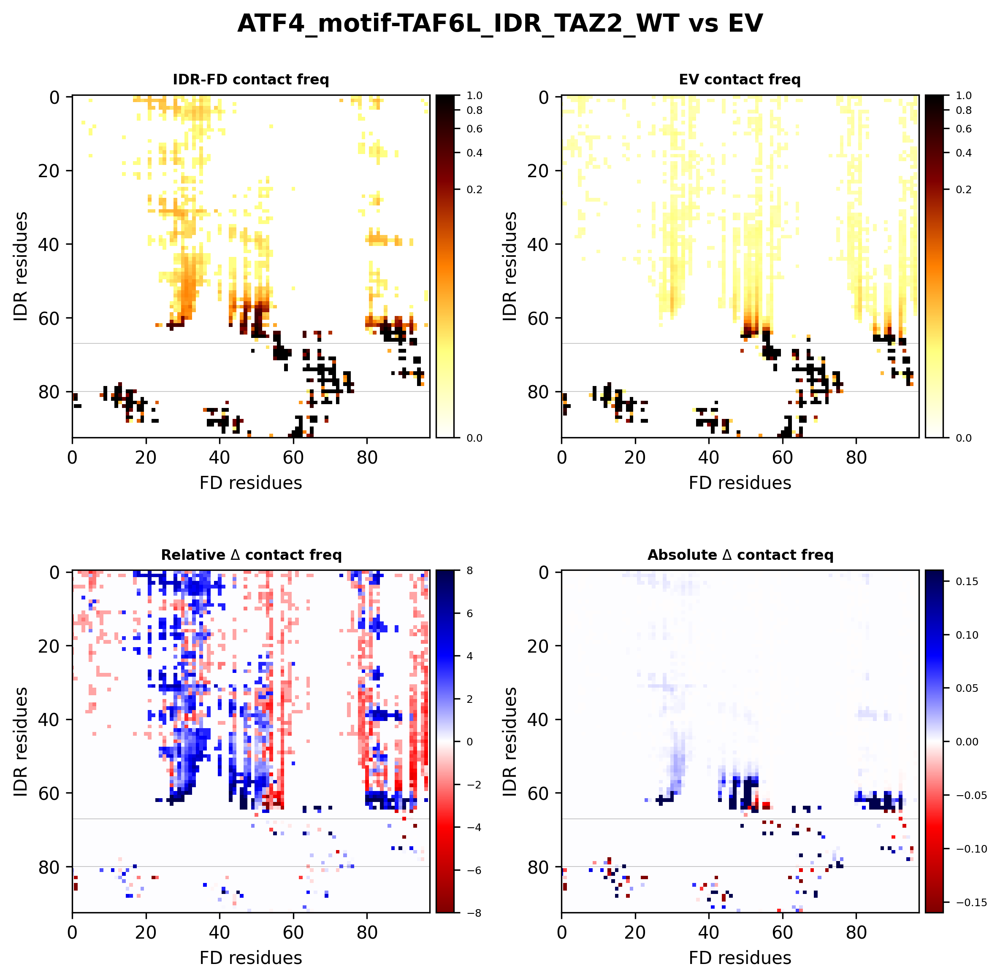

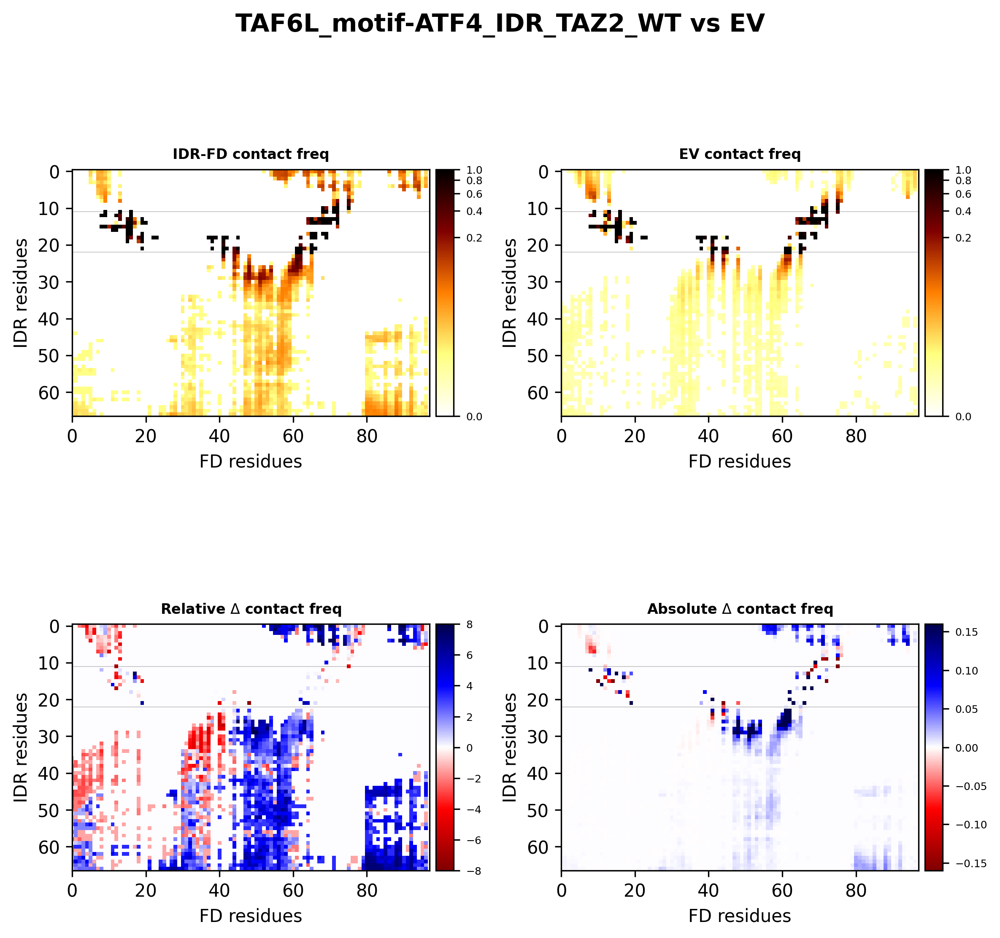

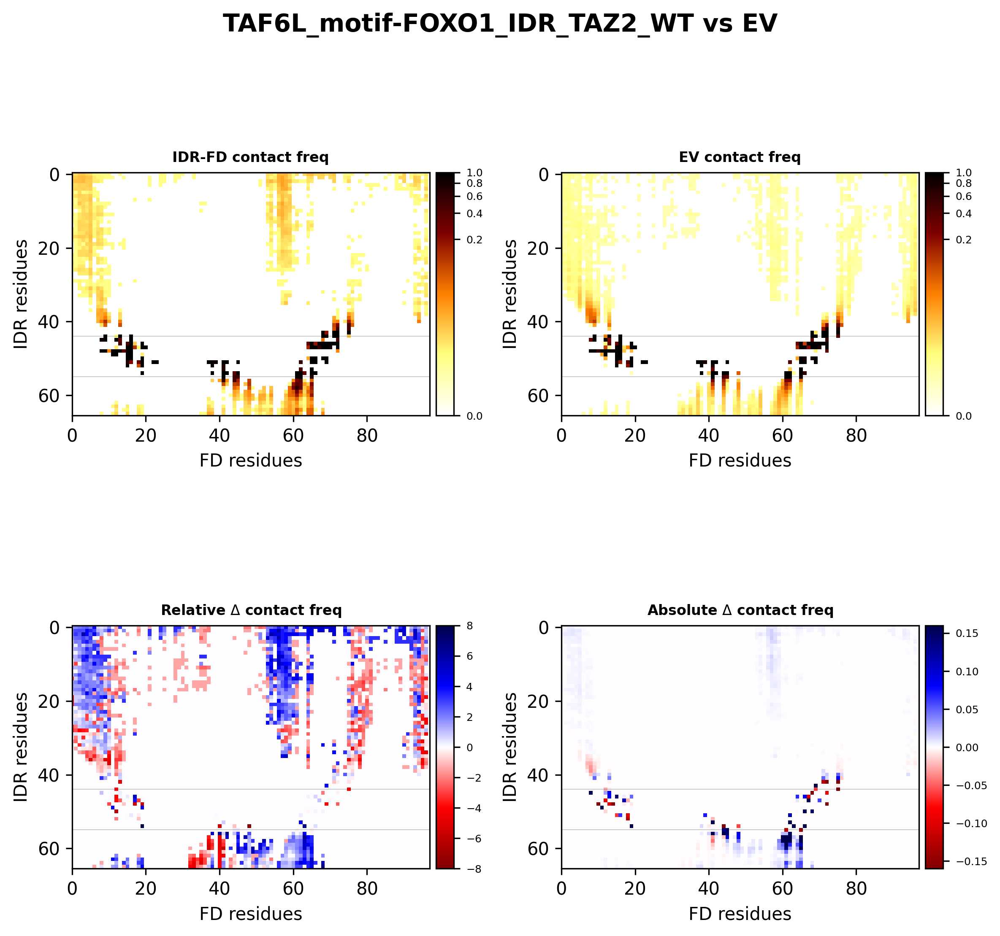

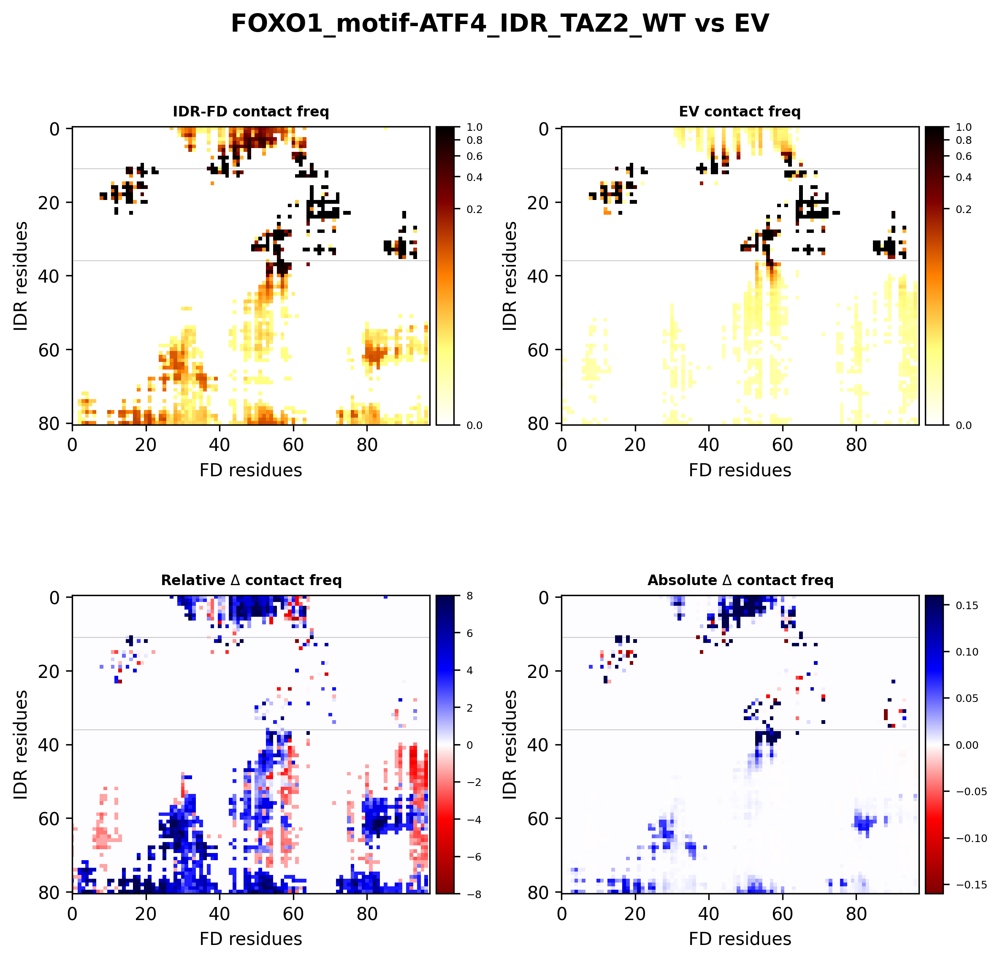

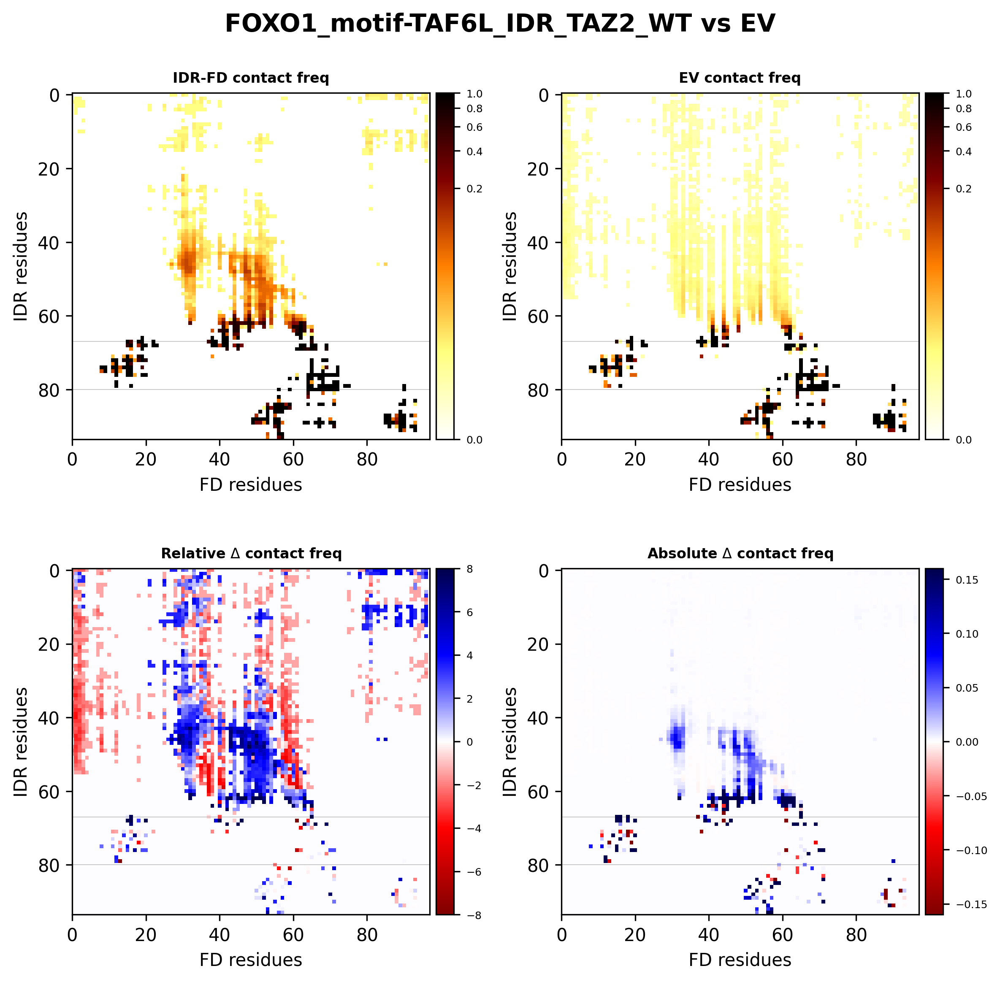

In [12]:
output_dir = '/home/degriffith/projects/TADs/bound_sims/flanking_contacts/p300_coactivators_analyses/figures/round1_variants'
# Compare all AD/motif sizes to EV
for v in variants:
    combined_plots(data[v]['cmap'], EV_data[v]['cmap'], 
                   data[v]['nframes'], EV_data[v]['nframes'], 
                   data[v]['fixed_res'], baseline='EV',
                   title=f'{v} vs EV', out=f'{output_dir}/{v}_TAZ2_EVcomparison_heatmap.png')

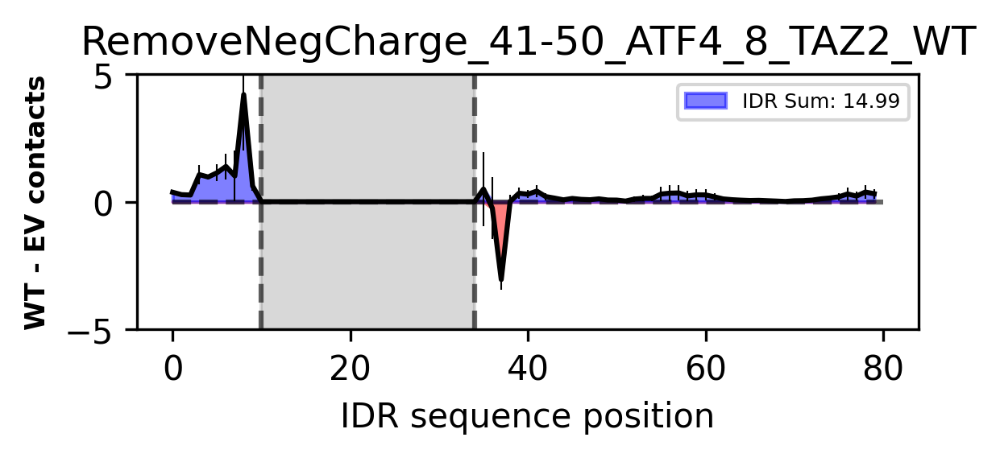

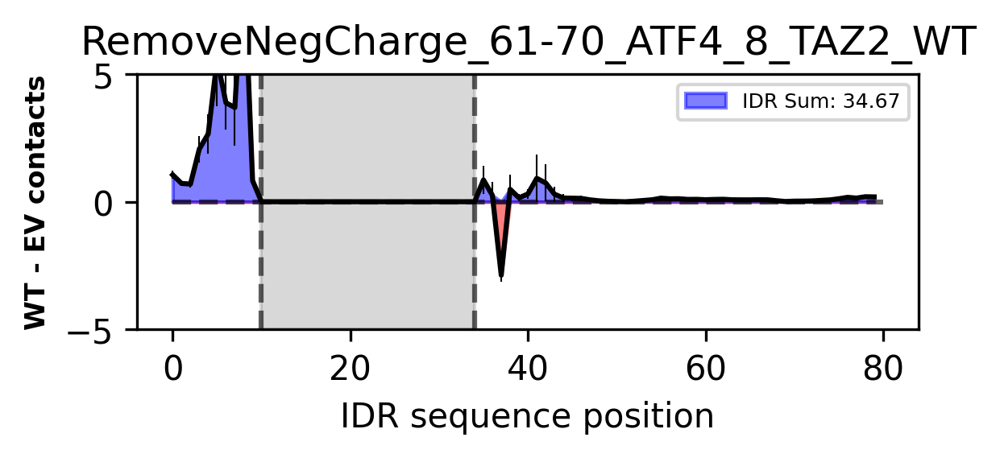

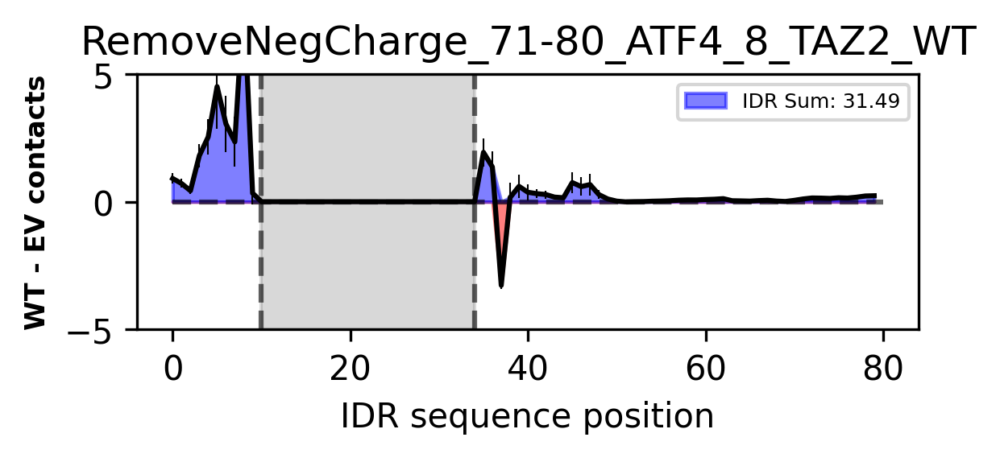

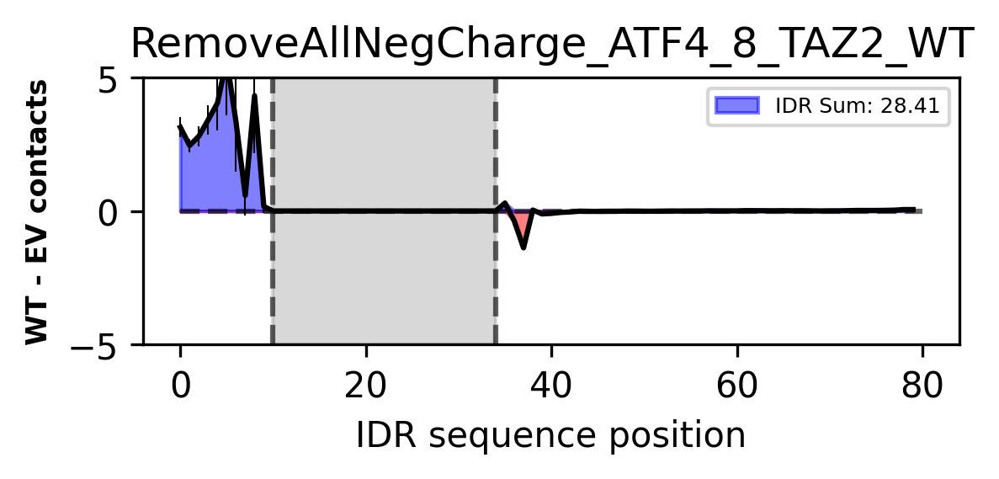

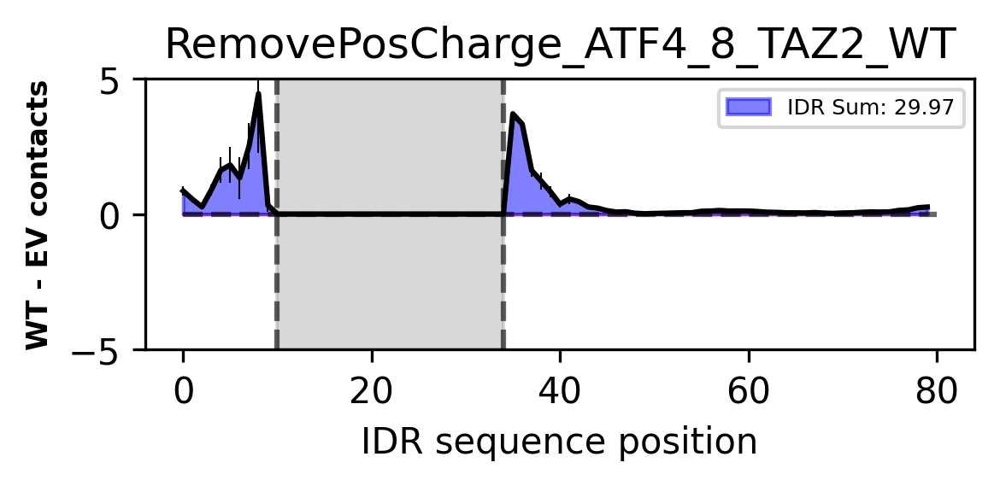

...

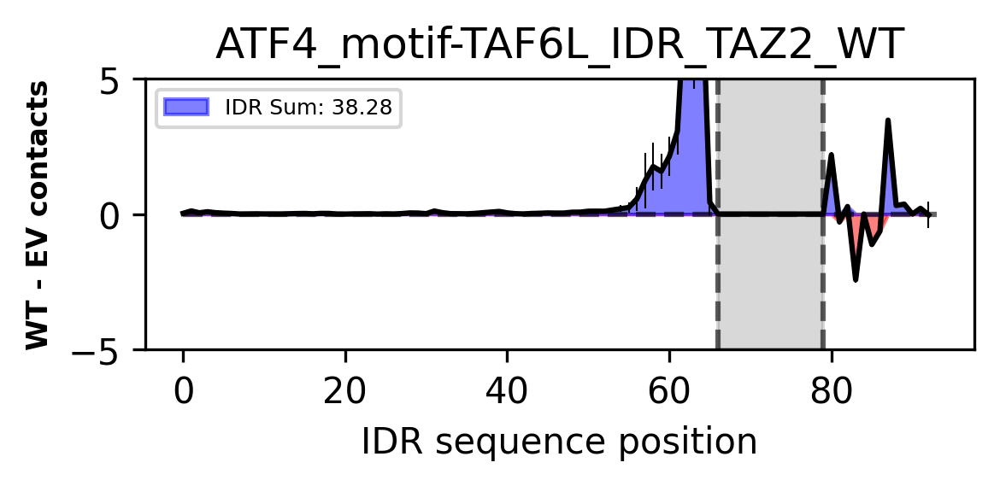

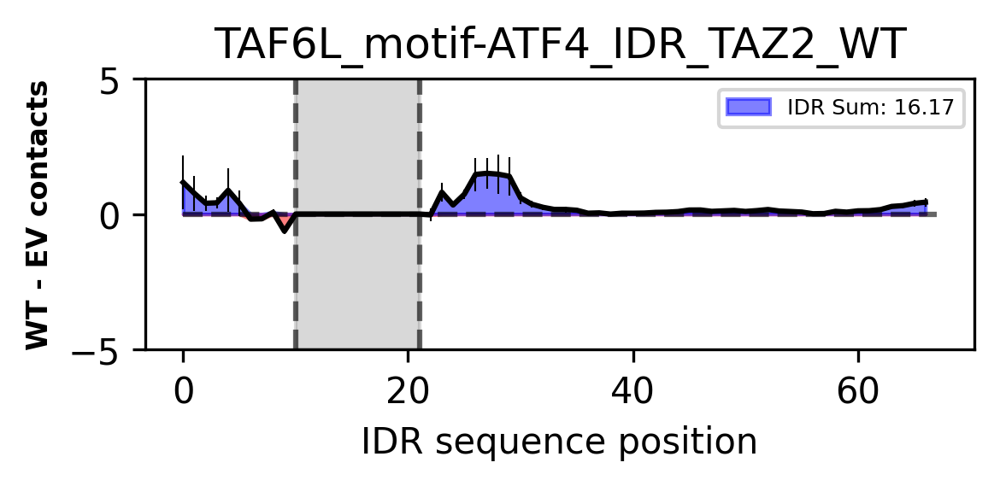

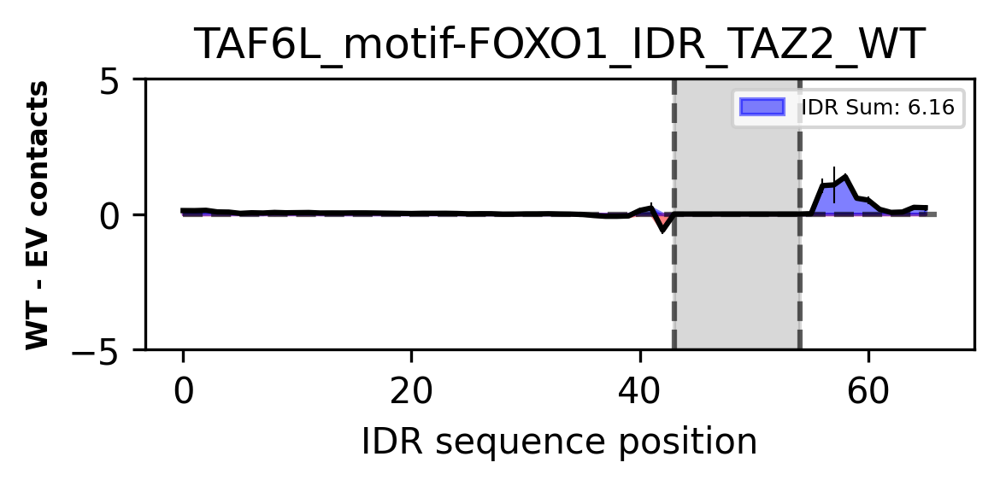

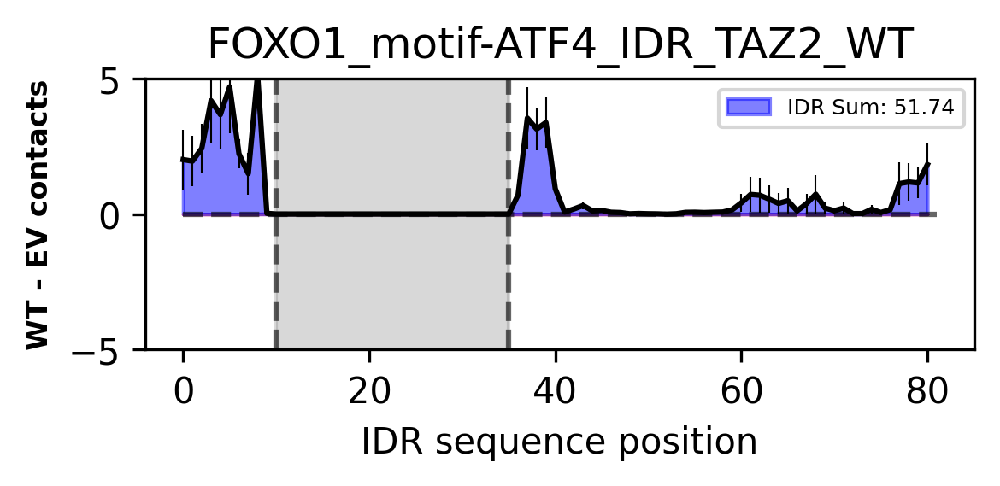

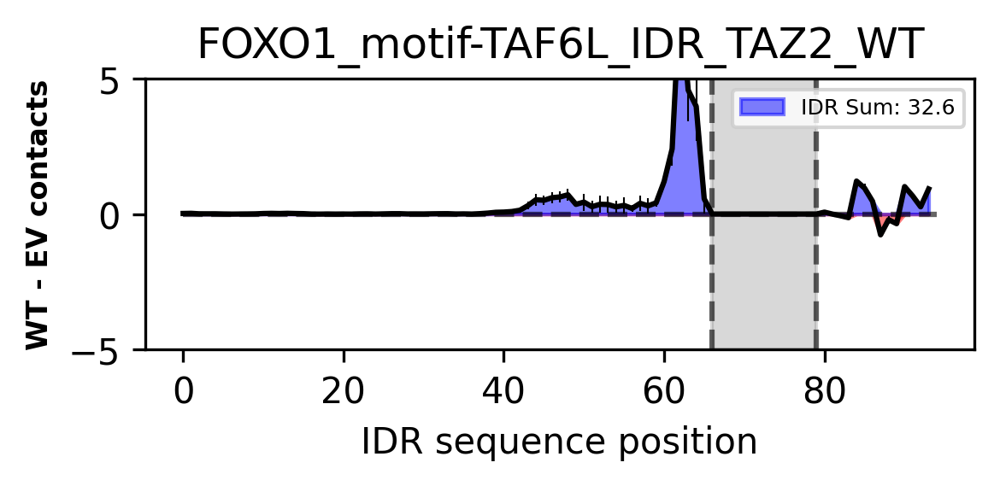

In [16]:
for v in variants:
    idr = data[v]['idr_contact_mean']
    idr[data[v]['fixed_res'][0]-1:data[v]['fixed_res'][1]] = 0

    idr_ev = EV_data[v]['idr_contact_mean']
    idr_ev[data[v]['fixed_res'][0]-1:data[v]['fixed_res'][1]] = 0

    idr_sem = data[v]['idr_contact_stderr'] + EV_data[v]['idr_contact_stderr']
    idr_sem[data[v]['fixed_res'][0]-1:data[v]['fixed_res'][1]] = 0

    seq_len = len(idr)

    plt.figure(figsize=(4,2),dpi=300)
    plt.ylim([-5,5])
    plt.title(f'{v}')

    diff = idr - idr_ev
    pos_interaction = [y if y >= 0.05 else 0 for y in diff]
    neg_interaction = [y if y < 0.05 else 0 for y in diff]

    plt.errorbar(x=np.arange(seq_len), y=diff, yerr=idr_sem, color='black', elinewidth=0.5)
    plt.fill_between( np.arange(seq_len), neg_interaction, np.zeros(seq_len), color='red', alpha=0.5)
    plt.fill_between( np.arange(seq_len), pos_interaction, np.zeros(seq_len), color='blue', alpha=0.5, 
                     label=f'IDR Sum: {np.around(np.sum(diff), 2)}')

    for idx in data[v]['fixed_res']:
        plt.vlines(idx-1, -5, 5, color='k',linestyle='--', alpha=0.6)
    plt.hlines(0, 0, seq_len, color='k',linestyle='--', alpha=0.6)
    plt.fill_betweenx(np.linspace(-5,5,100), 
                      [data[v]['fixed_res'][0]-1]*100, 
                      [data[v]['fixed_res'][1]-1]*100,
                     color='gray', alpha=0.3)

    plt.ylabel('WT - EV contacts', fontsize=8, fontweight='bold')
    plt.xlabel('IDR sequence position')
    plt.legend(fontsize=6)
    plt.tight_layout()
    plt.savefig(f'{output_dir}/{v}_IDRcontact_diff_plot.png')
    plt.show()

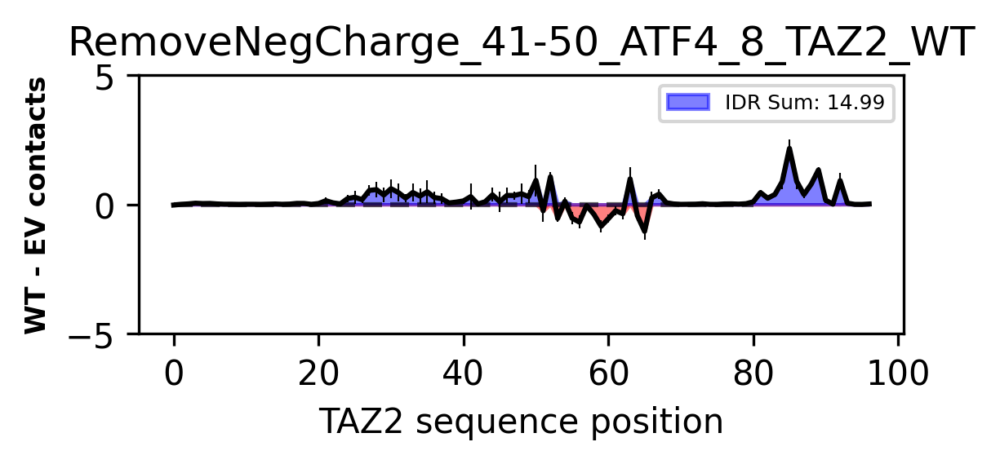

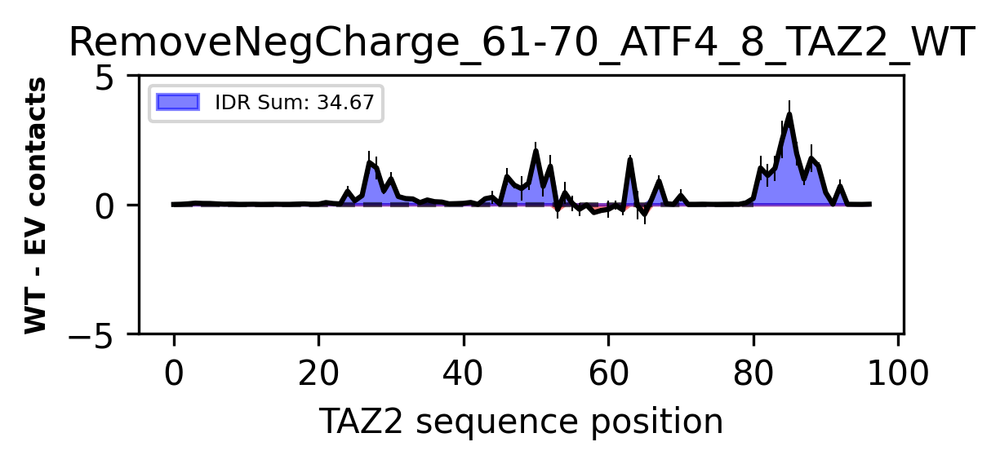

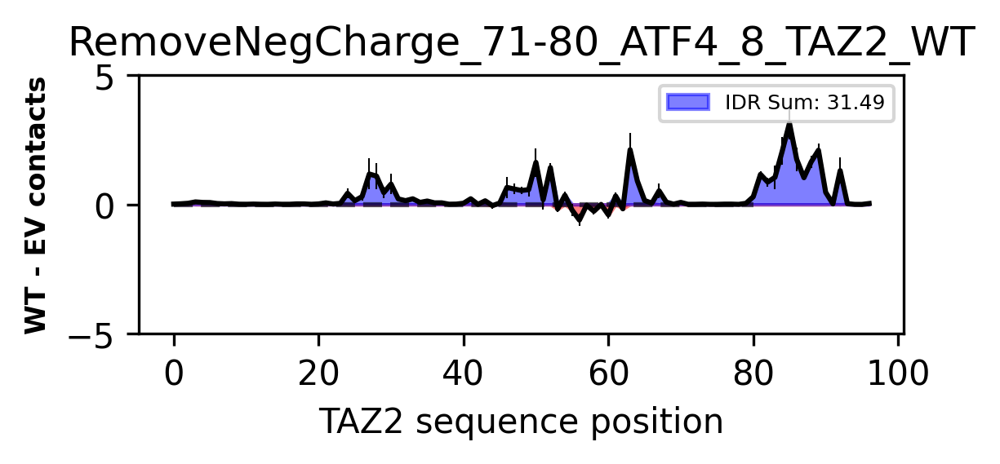

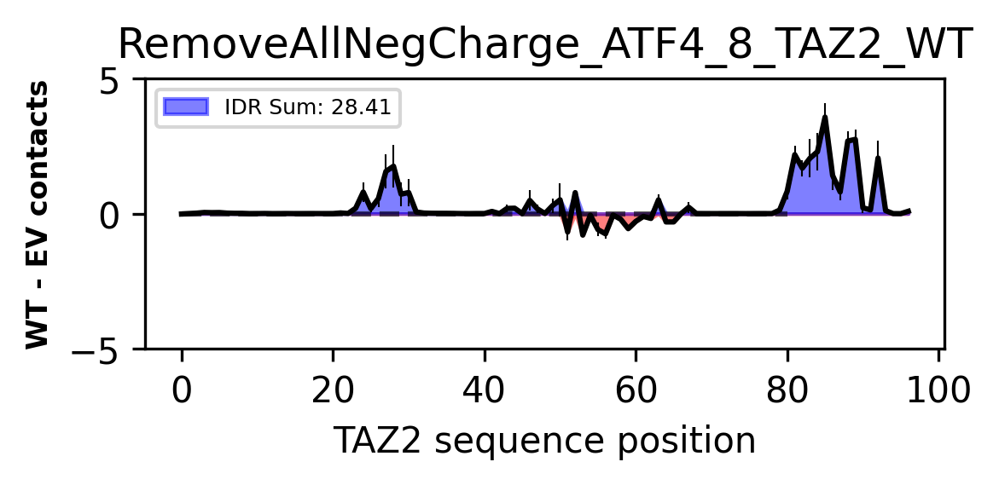

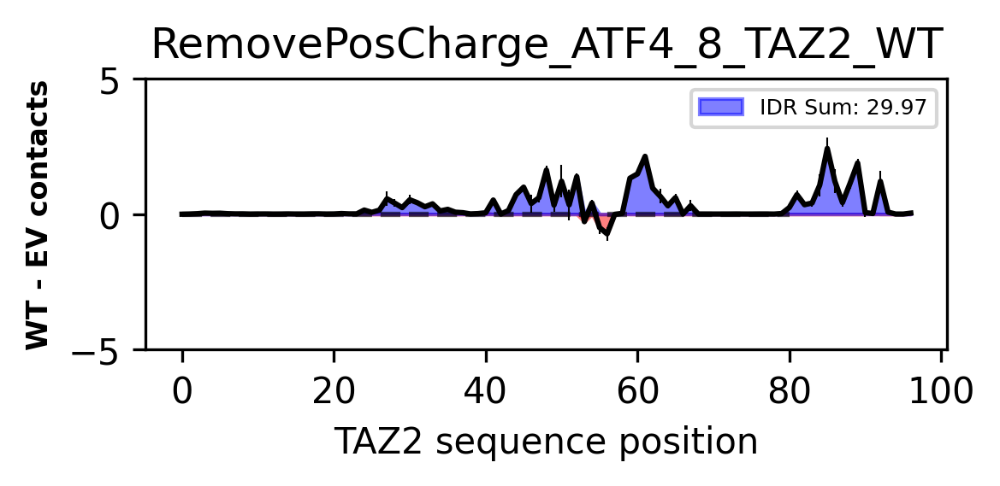

...

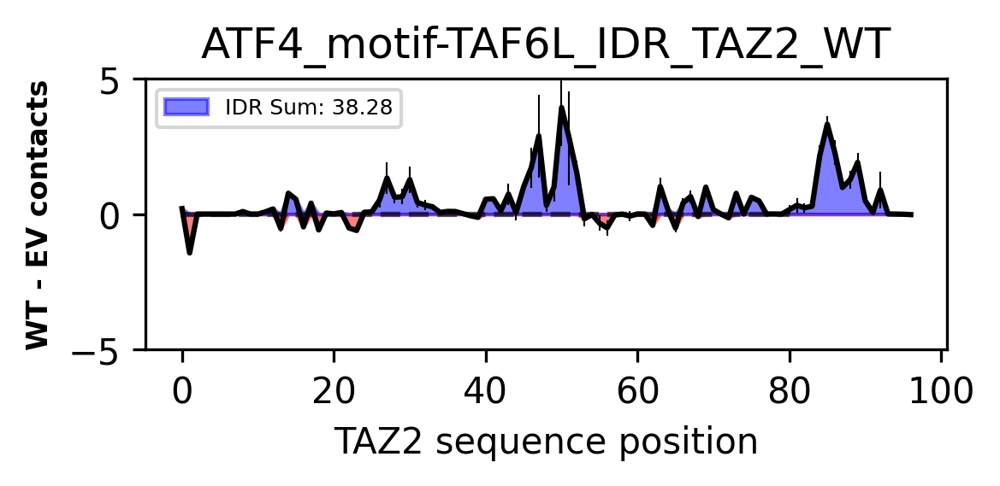

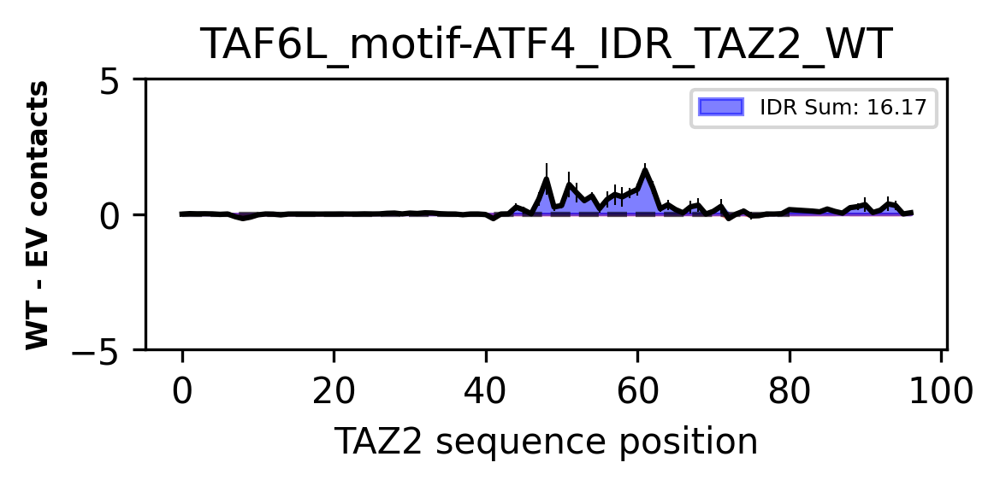

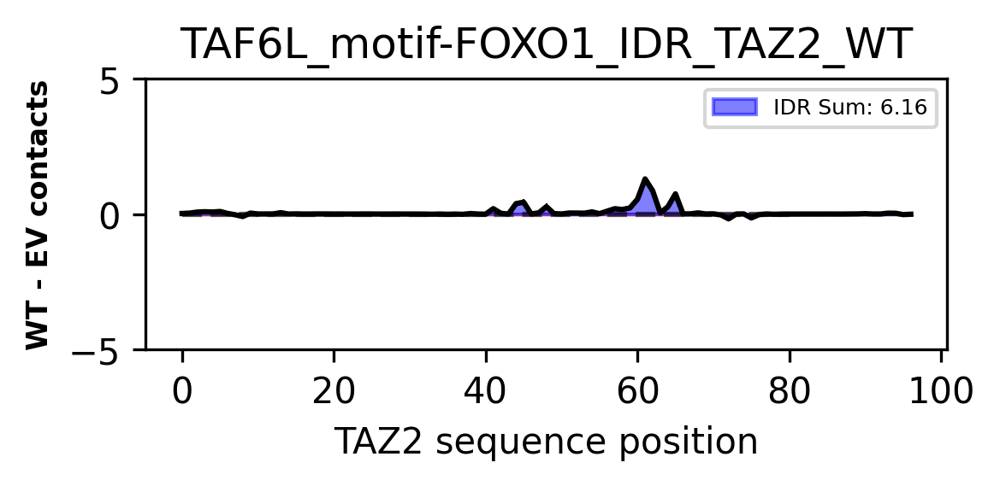

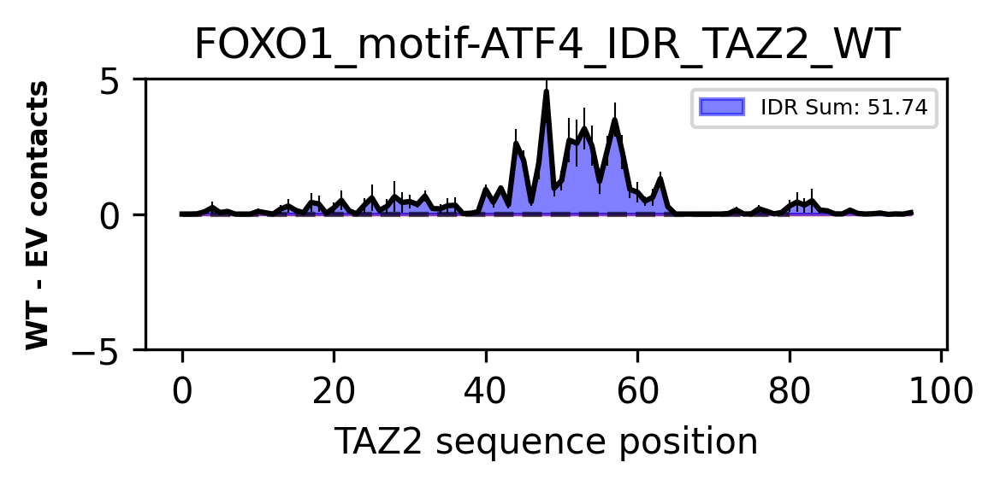

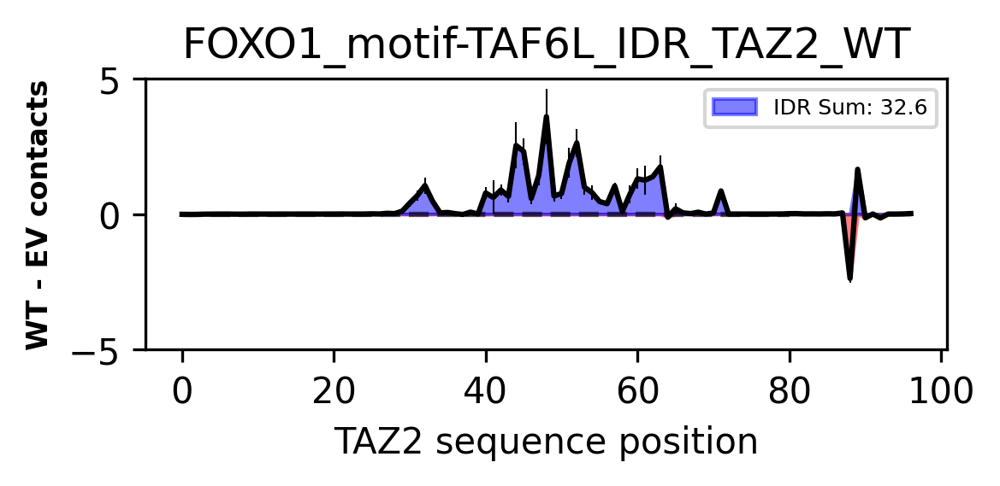

In [17]:
# EV comparison
for v in variants:
        fd = data[v]['fd_contact_mean']
        fd_ev = EV_data[v]['fd_contact_mean']    
        fd_sem = data[v]['fd_contact_stderr'] + EV_data[v]['fd_contact_stderr']
        
        plt.figure(figsize=(4,2),dpi=300)
        plt.ylim([-5,5])
        plt.title(f'{v}')

        
        diff = fd - fd_ev
        pos_interaction = [y if y >= 0.05 else 0 for y in diff]
        neg_interaction = [y if y < 0.05 else 0 for y in diff]

        plt.errorbar(x=np.arange(len(fd)), y=diff, yerr=fd_sem, color='black', elinewidth=0.5)
        plt.fill_between( np.arange(len(fd)), neg_interaction, np.zeros(len(fd)), color='red', alpha=0.5)
        plt.fill_between( np.arange(len(fd)), pos_interaction, np.zeros(len(fd)), color='blue', alpha=0.5,
                         label=f'IDR Sum: {np.around(np.sum(diff), 2)}')
        plt.hlines(0, 0, 80, color='k',linestyle='--', alpha=0.6)
              
        
        plt.ylabel('WT - EV contacts', fontsize=8, fontweight='bold')
        plt.xlabel('TAZ2 sequence position')
        plt.legend(fontsize=6)
        plt.tight_layout()
        plt.savefig(f'{output_dir}/{v}_FDcontact_diff_plot.png')
        plt.show()